In [1]:
from astropy.table import Table
from dendrocat import RadioSource
from astropy.io import fits
from spectral_cube import SpectralCube
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import numpy as np
import sys
import importlib
from astropy.wcs import WCS
from scipy import interpolate
import pandas as pd
import sympy as syp
from astropy import units as u
import radio_beam
from astropy.table import Table
from radio_beam import Beam
from astropy import coordinates
from astropy import wcs
from astropy.nddata.utils import Cutout2D
from astropy.io import ascii
from matplotlib.patches import Rectangle, Ellipse

W51 = '/orange/adamginsburg/w51/TaehwaYoo/'
W51b6 = '/orange/adamginsburg/w51/TaehwaYoo/2015.1.01596.S_W51_B6_LB/continuum_images/'
W51cont='/orange/adamginsburg/w51/TaehwaYoo/b6contfits/'
w51e2_b6_briggs=W51cont+'W51e2_cont_bigbriggs.image.fits'
w51e2_b6_robust0=W51cont+'W51e2_cont_big_robust0.image.fits'
w51e2_b6_uniform=W51cont+'W51e2_cont_biguniform.image.fits'
w51e2_b6_superuniform=W51cont+'W51e2_cont_bigsuperuniform.image.fits'

w51n_b6_briggs = W51cont+'W51n_cont_bigbriggs.image.fits'
w51n_b6_robust0 = W51cont+'w51n_cont_big_robust0.image.fits'
w51n_b6_uniform = W51cont+'W51n_cont_biguniform.image.fits'
w51n_b6_superuniform = W51cont+'W51n_cont_bigsuperuniform.image.fits'
w51n_b6_natural = W51cont+'W51n_cont_bignatural.image.fits'

W51b3 = '/orange/adamginsburg/w51/TaehwaYoo/2017.1.00293.S_W51_B3_LB/may2021_successful_imaging/'

w51n_b3_tt0 = W51b3+'w51n.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.image.tt0.pbcor.fits'
w51n_b3_tt1 = W51+'w51n.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.image.tt1.pbcor.fits'
w51n_b3_alpha = W51+'w51n.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.alpha.pbcor.fits'

w51conv = '/orange/adamginsburg/w51/TaehwaYoo/convolved_new/'
w51n_b6_conv = w51conv + 'w51n_cont_bigbriggs.image.convB3_briggs.fits'

w51e_b3_tt0 = W51b3+'w51e2.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.image.tt0.pbcor.fits'
w51e2_b3_tt1 = W51+'w51e2.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.image.tt1.pbcor.fits'
w51e2_b3_alpha = W51+'w51e2.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.alpha.pbcor.fits'

w51e2_b6_conv = w51conv + 'w51e2_cont_bigbriggs.image.convB3_briggs.fits'

w51e_b6_almaimf_conv = '/orange/adamginsburg/w51/TaehwaYoo/w51_alma_imf/w51e_B6_conv.fits'
w51e_b3_almaimf_conv = '/orange/adamginsburg/w51/TaehwaYoo/w51_alma_imf/w51e_B3_conv.fits'


w51n_b3_almaimf_conv = '/orange/adamginsburg/w51/TaehwaYoo/w51_alma_imf/w51n_B3_conv.fits'

w51n_b3_almaimf = '/orange/adamginsburg/w51/TaehwaYoo/w51_alma_imf/W51-IRS2_B3_uid___A001_X1296_X18f_continuum_merged_12M_robust0_selfcal4_finaliter.image.tt0.pbcor.fits'
w51n_b6_almaimf = '/orange/adamginsburg/w51/TaehwaYoo/w51_alma_imf/W51-IRS2_B6_uid___A001_X1296_X187_continuum_merged_12M_robust0_selfcal9_finaliter.image.tt0.pbcor.fits'
w51e_b3_almaimf = '/orange/adamginsburg/w51/TaehwaYoo/w51_alma_imf/W51-E_B3_uid___A001_X1296_X10b_continuum_merged_12M_robust0_selfcal7_finaliter.image.tt0.pbcor.fits'
w51e_b6_almaimf = '/orange/adamginsburg/w51/TaehwaYoo/w51_alma_imf/W51-E_B6_uid___A001_X1296_X213_continuum_merged_12M_robust0_selfcal7_finaliter.image.tt0.pbcor.fits'


w51n_b6_conv_briggs = w51conv + 'w51n_briggs_B6_conv.fits'
w51n_b6_conv_robust0 = w51conv + 'w51n_robust0_B6_conv.fits'
w51n_b6_conv_superuniform = w51conv + 'w51n_superuniform_B6_conv.fits'

w51e_b6_conv_briggs = w51conv + 'w51e_briggs_B6_conv.fits'
w51e_b6_conv_robust0 = w51conv + 'w51e_robust0_B6_conv.fits'
w51n_b6_conv_superuniform = w51conv + 'w51e_superuniform_B6_conv.fits'
#----------

#w51e_b3_tt0 = '/Users/dbahck37/W51data/w51e2.spw0thru19.14500.robust0.thr0.075mJy.mfs.I.startmod.selfcal7.image.tt0.pbcor.fits'

#w51e_b6_conv_briggs ='/Users/dbahck37/W51data/convolved_new/w51e_briggs_B6_conv.fits'

catalogdir = '/orange/adamginsburg/ALMA_IMF/catalogs/getsf-smoothed/'
cat_w51e = catalogdir + 'W51-E-getsf.cat'
cat_w51n = catalogdir + 'W51-IRS2-getsf.cat'




rec_ind [ 0  1  2  3  4  5  7  8  9 10 11 12 13 14 16 17 18 20 28 29 31 35 55 57
 82]
x_pix
-----
 8253
 8101
 7028
 7628
 7826
 7764
 7491
 7343
 7604
 7146
 7185
 7552
 7083
 7782
 7183
 7047
 7280
 7047
 7008
 7272
 7256
 7115 y_pix
-----
 7015
 7129
 7167
 7226
 7273
 7278
 7286
 7299
 7294
 7319
 7303
 7307
 7351
 7331
 7333
 7342
 7351
 7358
 7361
 7367
 7409
 7311
ind1 [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]


(6800.0, 7889.330901754125)

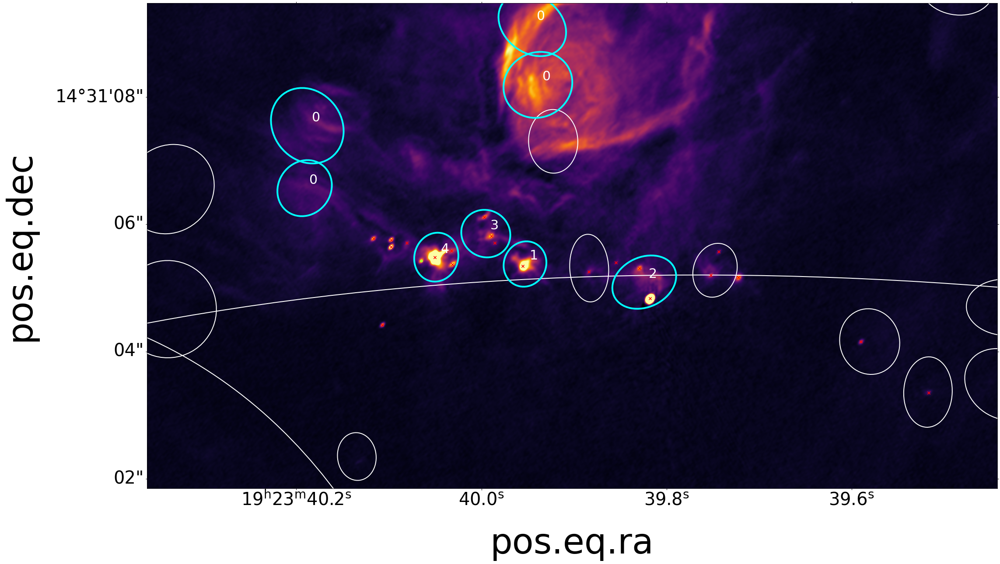

In [11]:
plt.rcParams['axes.labelsize']=80
plt.rcParams['xtick.labelsize']=40
plt.rcParams['ytick.labelsize']=40
plt.rcParams['axes.titlesize']=80

fitsdata = fits.open(w51n_b3_tt0)
image = fitsdata[0].data
hdrNB = fits.getheader(w51n_b3_tt0)  
wcsNB = WCS(hdrNB,naxis=2)
scaleNB = wcsNB.proj_plane_pixel_scales()[0]
scaleNB_phy = scaleNB * np.pi / 180 * 5.41e3 

def count_points_in_ellipse(xcen,ycen,major,minor,pa,xpos,ypos):
    # caclulate foci positions 
    # must be full major, minor not semi major, minor
    fodx = np.cos(pa)*np.sqrt((major/2)**2-(minor/2)**2)
    fody = np.sin(pa)*np.sqrt((major/2)**2-(minor/2)**2)
    
    fox1 = xcen + fodx
    foy1 = ycen + fody
    
    fox2 = xcen - fodx
    foy2 = ycen - fody
    
    dist1 = np.sqrt((xpos-fox1)**2+(ypos-foy1)**2)
    dist2 = np.sqrt((xpos-fox2)**2+(ypos-foy2)**2)
    
    isinside = np.where(dist1+dist2<major)[0]
    
    return len(isinside), isinside

def plot_catalog_on_image(ax,image,hdrNB,catdatadir,isb3=True,beam=None,use_criteria=True, 
                          label=None,color='cyan',lw=2,aperture='fwhm+beam',xysource=None,vmin=-0.000103489713773963128,vmax=0.0022162524723021867, plot_no=False):
    catdata = ascii.read(catdatadir,data_start=0,format='commented_header', header_start=120,  comment="!")
    sky_ra = catdata['WCS_ACOOR']
    sky_dec = catdata['WCS_DCOOR']
    no = catdata['NO']
    if isb3:
        bandlabel = '03'
    else:
        bandlabel = '02'
    fooa = catdata['FOOA%s'%bandlabel]
    foob = catdata['FOOB%s'%bandlabel]
    theta = catdata['THETA%s'%bandlabel]
    afwhm = catdata['AFWHM%s'%bandlabel]
    bfwhm = catdata['BFWHM%s'%bandlabel]
   
    if use_criteria and label is None:
        
        rec_ind = np.where((np.abs(catdata['GOODM%s'%bandlabel])>1)&
                   (np.abs(catdata['SIGNM%s'%bandlabel])>1)&
                   (catdata['FXP_BST%s'%bandlabel]/catdata['FXP_ERR%s'%bandlabel]>2)&
                   (catdata['FXT_BST%s'%bandlabel]/catdata['FXT_ERR%s'%bandlabel]>2)&
                   (catdata['AFWHM%s'%bandlabel]/catdata['BFWHM%s'%bandlabel]<2)&
                   (catdata['FOOA%s'%bandlabel]/catdata['AFWHM%s'%bandlabel]>1.15))[0]
        """
        rec_ind = np.where((np.abs(catdata['GOODM03'])>1)&
                   (np.abs(catdata['SIGNM03'])>1)&
                   (catdata['FXP_BST03']/catdata['FXP_ERR03']>2)&
                   (catdata['FXT_BST03']/catdata['FXT_ERR03']>2)&
                   (catdata['AFWHM03']/catdata['BFWHM03']<2)&
                   (catdata['FOOA03']/catdata['AFWHM03']>1.15) &
                   (np.abs(catdata['GOODM02'])>1) &
                   (np.abs(catdata['SIGNM02'])>1)&
                   (catdata['FXP_BST02']/catdata['FXP_ERR02']>2)&
                   (catdata['FXT_BST02']/catdata['FXT_ERR02']>2)&
                   (catdata['AFWHM02']/catdata['BFWHM02']<2)&
                   (catdata['FOOA02']/catdata['AFWHM02']>1.15))[0]
        """
        print('rec_ind',rec_ind)
        sky_ra= sky_ra[rec_ind]
        sky_dec = sky_dec[rec_ind]
        fooa = fooa[rec_ind]
        foob = foob[rec_ind]
        theta = theta[rec_ind]
        no = no[rec_ind]
        afwhm = afwhm[rec_ind]
        bfwhm = bfwhm[rec_ind]
        
    
    if label is not None:
        label = [i-1 for i in label]
        sky_ra= sky_ra[label]
        sky_dec = sky_dec[label]
        fooa = fooa[label]
        foob = foob[label]
        theta = theta[label]
        no = no[label]
        afwhm = afwhm[label]
        bfwhm = bfwhm[label]

    skypos = np.vstack((sky_ra,sky_dec)).T

    
    wcsNB = WCS(hdrNB,naxis=2)
    scaleNB = wcsNB.proj_plane_pixel_scales()[0]
    beamNB = Beam.from_fits_header(hdrNB)


    image = fitsdata[0].data[0][0]
    ax1.imshow(image, origin='lower',cmap=plt.get_cmap('inferno'),vmin=vmin,vmax=vmax)

    xypos = wcsNB.wcs_world2pix(skypos,0)
    xpos = xypos[:,0]
    ypos = xypos[:,1]
    
    
        
    indexlist = []
    for i in range(len(xypos)):
        if aperture is 'footprint':
            major = fooa[i]/3600/scaleNB.value
            minor = foob[i]/3600/scaleNB.value
            pa = 180-theta[i]
        elif aperture is 'fwhm+beam':
            meanbeamsize = (beam.major.value+beam.minor.value)/4
            major = (afwhm[i]/3600+meanbeamsize)/scaleNB.value
            minor = (bfwhm[i]/3600+meanbeamsize)/scaleNB.value
            pa = 180-theta[i]
        elif aperture is 'beam':
            major = beam.major.value/scaleNB.value
            minor = beam.minor.value/scaleNB.value
            pa = 180-beam.pa.value

        ellipse = Ellipse(xypos[i],width=major,height=minor,facecolor='none',
                          angle=180-pa,edgecolor=color,lw=lw)
        
        ax.add_patch(ellipse)
        if xysource is not None:
            numsource, indsource = count_points_in_ellipse(xpos[i],ypos[i],major,minor,pa,xysource[:,0],xysource[:,1])
            
            
            if plot_no:
                ax.text(xpos[i]+10,ypos[i]+10,'%d'%no[i],color='cyan',fontsize=30,clip_on=True)
            else:
                ax.text(xpos[i]+10,ypos[i]+10,'%d'%numsource,color='w',fontsize=30,clip_on=True)

            indexlist.append(indsource)
    if xysource is not None:
        return indexlist
    
def plot_dendrogram(ax, catalog , wcsNB=None,legend=True, size=40,color='r' ):
    if wcsNB is not None:
        xsky = catalog['x_sky']
        ysky = catalog['y_sky']
        xysky = np.vstack((xsky, ysky)).T
        xypos = wcsNB.wcs_world2pix(xysky,0)
        xpos = xypos[:,0]
        ypos = xypos[:,1]
        
    else:
        xpos = catalog['x_pix']
        ypos = catalog['y_pix']
    print(xpos,ypos)
    kind = catalog['kind']
    
    #detected in both band
    ind1 = np.where(kind==0)[0]
    print('ind1',ind1)
    ax.scatter(xpos[ind1], ypos[ind1], s=size, marker='x',color=color,label='B3B6')
    #detected in only one band
    ind2 = np.where(kind==1)[0]
    ax.scatter(xpos[ind2], ypos[ind2], s=size-10, marker='o',color='greenyellow',label='B3')
    ind3 = np.where(kind==2)[0]
    ax.scatter(xpos[ind3], ypos[ind3], s=size-10, marker='s',color='cyan',label='B6')
    
fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB)
catalog = Table.read('../spectral_index/w51n_combined_catalog.fits',format='fits')
hdrNBalmaimf = fits.getheader(w51n_b3_almaimf)  
wcsNBalmaimf = WCS(hdrNBalmaimf,naxis=2)
beamalmaimf = Beam.from_fits_header(hdrNBalmaimf)    
xysource = np.vstack((catalog['x_pix'],catalog['y_pix'])).T
plot_catalog_on_image(ax1,image,hdrNB,cat_w51n,isb3=True,beam=beamalmaimf,use_criteria=False,color='w')

plot_catalog_on_image(ax1,image,hdrNB,cat_w51n,isb3=True,beam=beamalmaimf,use_criteria=True,xysource=xysource,lw=4)
plot_dendrogram(ax1, catalog)
ax1.set_xlim(6500, 6500+0.35/scaleNB_phy.value)
ax1.set_ylim(6800, 6800+0.2/scaleNB_phy.value)


x_pix
-----
 8253
 8101
 7028
 7628
 7826
 7764
 7491
 7343
 7604
 7146
 7185
 7552
 7083
 7782
 7183
 7047
 7280
 7047
 7008
 7272
 7256
 7115 y_pix
-----
 7015
 7129
 7167
 7226
 7273
 7278
 7286
 7299
 7294
 7319
 7303
 7307
 7351
 7331
 7333
 7342
 7351
 7358
 7361
 7367
 7409
 7311
ind1 [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]
<SkyCoord (ICRS): (ra, dec) in deg
    (290.9181731, 14.51708333)> <SkyCoord (ICRS): (ra, dec) in deg
    (290.91434407, 14.51910424)>


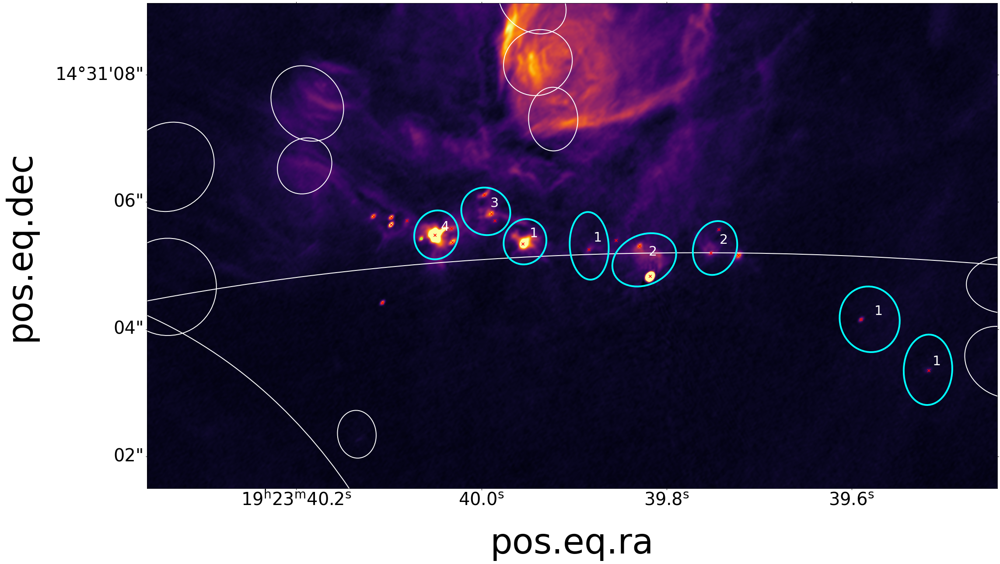

In [3]:
fitsdata = fits.open(w51n_b3_tt0)
image = fitsdata[0].data
hdrNB = fits.getheader(w51n_b3_tt0)  
wcsNB = WCS(hdrNB,naxis=2)

hdrNBalmaimf = fits.getheader(w51n_b3_almaimf)  
wcsNBalmaimf = WCS(hdrNBalmaimf,naxis=2)
beamalmaimf = Beam.from_fits_header(hdrNBalmaimf)
fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB)
plot_catalog_on_image(ax1,image,hdrNB,cat_w51n,isb3=True,beam=beamalmaimf,use_criteria=False,color='w')

plot_catalog_on_image(ax1,image,hdrNB,cat_w51n,isb3=True,beam=beamalmaimf,use_criteria=False,label=[1,6,2,41,5,7,68,25],lw=4,xysource=xysource)
catalog = Table.read('../spectral_index/w51n_combined_catalog.fits',format='fits')
plot_dendrogram(ax1, catalog)
ax1.set_xlim(6500, 6500+0.35/scaleNB_phy.value)
ax1.set_ylim(6750, 6750+0.2/scaleNB_phy.value)
skylim1 = wcsNB.pixel_to_world(6500,6750)
skylim2 = wcsNB.pixel_to_world(6500+0.35/scaleNB_phy.value,6700+0.2/scaleNB_phy.value)
print(skylim1,skylim2)
#skycoord1 = coordinates.SkyCoord(skylim1[0].value, skylim1[1].value,
#                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))


#skycoord2 = coordinates.SkyCoord(skylim2[0], skylim2[1],
#                            frame=wcs.utils.wcs_to_celestial_frame(wcsNB3).name,unit=(u.deg,u.deg))


rec_ind [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  16  17  18
  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37
  39  40  41  42  43  45  46  47  48  49  50  51  52  53  54  55  56  57
  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75
  76  77  78  79  80  83  84  85  86  87  88  89  90  91  93  94  96  97
  98  99 100 101 103 104 105 106 107 112 113 116 118]
x_pix
-----
 8253
 8101
 7028
 7628
 7826
 7764
 7491
 7343
 7604
 7146
 7185
 7552
 7083
 7782
 7183
 7047
 7280
 7047
 7008
 7272
 7256
 7115 y_pix
-----
 7015
 7129
 7167
 7226
 7273
 7278
 7286
 7299
 7294
 7319
 7303
 7307
 7351
 7331
 7333
 7342
 7351
 7358
 7361
 7367
 7409
 7311
ind1 [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]


(5199.999122723226, 6655.0648179611)

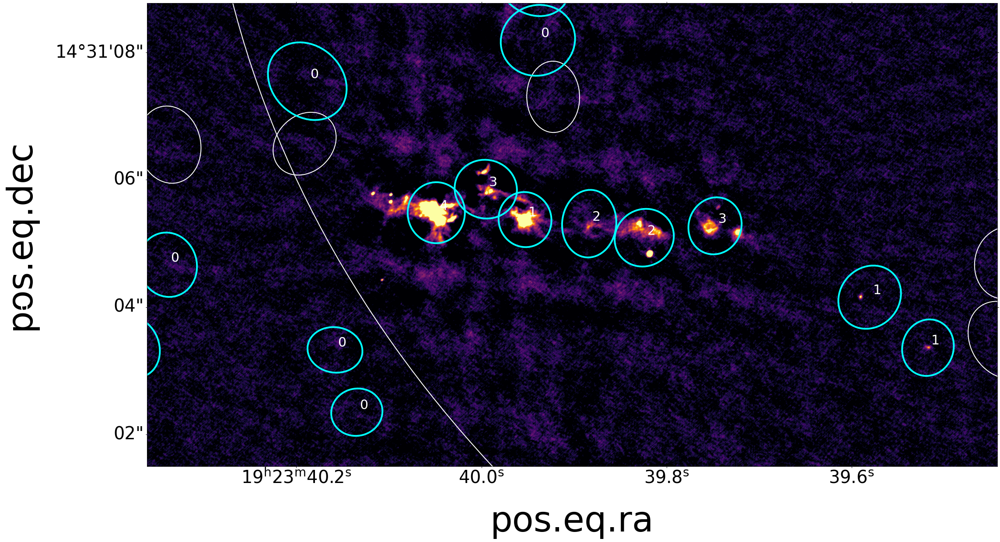

In [4]:
fitsdata = fits.open(w51n_b6_briggs)
image = fitsdata[0].data
hdrNB = fits.getheader(w51n_b6_briggs)  
wcsNB = WCS(hdrNB,naxis=2)
scaleNB = wcsNB.proj_plane_pixel_scales()[0]
scaleNB_phy = scaleNB * np.pi / 180 * 5.41e3 
fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB)

hdrNBalmaimf = fits.getheader(w51n_b6_almaimf)  
wcsNBalmaimf = WCS(hdrNBalmaimf,naxis=2)
beamalmaimf = Beam.from_fits_header(hdrNBalmaimf)    
skysource = np.vstack((catalog['x_sky'],catalog['y_sky'])).T
xysource = wcsNB.wcs_world2pix(skysource,0)
plot_catalog_on_image(ax1,image,hdrNB,cat_w51n,isb3=False,beam=beamalmaimf,use_criteria=False,color='w')

plot_catalog_on_image(ax1,image,hdrNB,cat_w51n,isb3=False,beam=beamalmaimf,use_criteria=True,xysource=xysource,lw=4)
plot_dendrogram(ax1, catalog)
pix1 = wcsNB.world_to_pixel(skylim1)
pix2 = wcsNB.world_to_pixel(skylim2)

ax1.set_xlim(pix1[0],pix2[0])
ax1.set_ylim(pix1[1],pix2[1])




x_pix
-----
 8253
 8101
 7028
 7628
 7826
 7764
 7491
 7343
 7604
 7146
 7185
 7552
 7083
 7782
 7183
 7047
 7280
 7047
 7008
 7272
 7256
 7115 y_pix
-----
 7015
 7129
 7167
 7226
 7273
 7278
 7286
 7299
 7294
 7319
 7303
 7307
 7351
 7331
 7333
 7342
 7351
 7358
 7361
 7367
 7409
 7311
ind1 [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]


(5199.999122723226, 6655.0648179611)

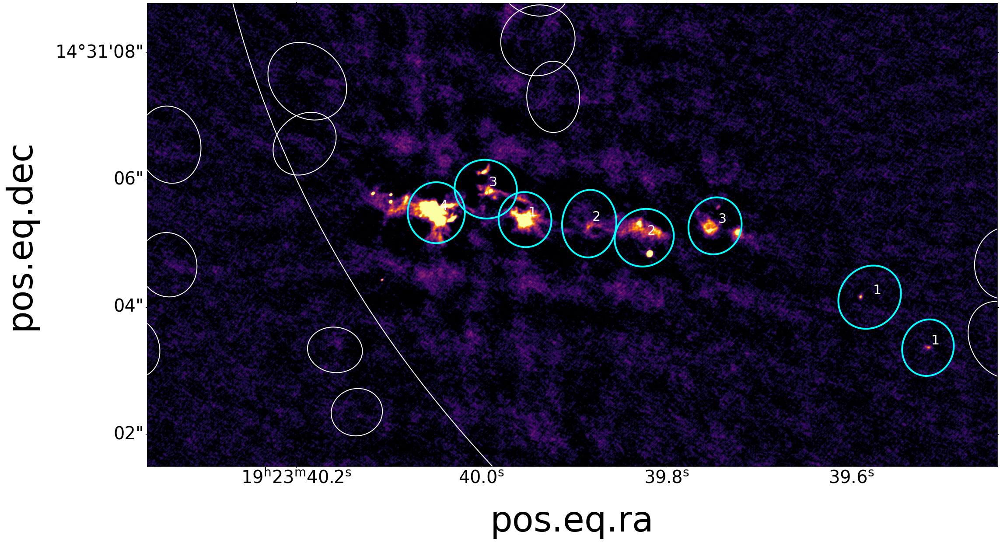

In [5]:
fitsdata = fits.open(w51n_b6_briggs)
image = fitsdata[0].data
hdrNB = fits.getheader(w51n_b6_briggs)  
wcsNB = WCS(hdrNB,naxis=2)
scaleNB = wcsNB.proj_plane_pixel_scales()[0]
scaleNB_phy = scaleNB * np.pi / 180 * 5.41e3 
fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB)

hdrNBalmaimf = fits.getheader(w51n_b6_almaimf)  
wcsNBalmaimf = WCS(hdrNBalmaimf,naxis=2)
beamalmaimf = Beam.from_fits_header(hdrNBalmaimf)    
skysource = np.vstack((catalog['x_sky'],catalog['y_sky'])).T
xysource = wcsNB.wcs_world2pix(skysource,0)
plot_catalog_on_image(ax1,image,hdrNB,cat_w51n,isb3=False,beam=beamalmaimf,use_criteria=False,color='w')

plot_catalog_on_image(ax1,image,hdrNB,cat_w51n,isb3=False,beam=beamalmaimf,use_criteria=True,xysource=xysource,lw=4,label=[1,6,2,41,5,7,68,25])
plot_dendrogram(ax1, catalog)
pix1 = wcsNB.world_to_pixel(skylim1)
pix2 = wcsNB.world_to_pixel(skylim2)

ax1.set_xlim(pix1[0],pix2[0])
ax1.set_ylim(pix1[1],pix2[1])




rec_ind [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  16  17  18
  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37
  39  40  41  42  43  45  46  47  48  49  50  51  52  53  54  55  56  57
  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75
  76  77  78  79  80  83  84  85  86  87  88  89  90  91  93  94  96  97
  98  99 100 101 103 104 105 106 107 112 113 116 118]
[7549.41058012 7336.61043464 5834.41038625 6674.41031094 6951.61025096
 6864.81024455 6482.61023436 6275.41021781 6640.81022414 5999.61019227
 6054.21021271 6568.01020755 5911.41015142 6890.01017693 6051.41017441
 5861.0101629  6187.21015144 5861.01014252 5806.41013869 6176.01013102
 6153.61007741 5956.21020249] [5571.00135981 5730.60116581 5783.79979648 5866.40056218 5932.20081486
 5939.20073573 5950.40038733 5968.60019845 5961.60053154 5996.59994706
 5974.19999684 5979.80046518 6041.39986667 6013.4007587  6016.19999428
 6028.79982072 6041.40011806 6051.19982074 605

(5199.999122723226, 6655.0648179611)

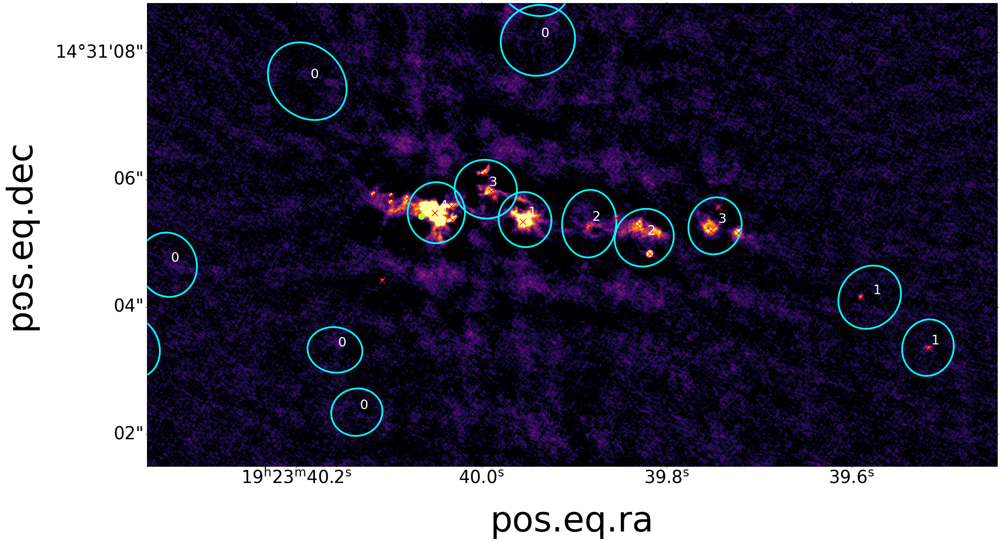

In [6]:
catalog = Table.read('../spectral_index/w51n_combined_catalog.fits',format='fits')

fitsdata = fits.open(w51n_b6_briggs)
image = fitsdata[0].data
hdrNB = fits.getheader(w51n_b6_briggs)  
wcsNB = WCS(hdrNB,naxis=2)
scaleNB = wcsNB.proj_plane_pixel_scales()[0]
scaleNB_phy = scaleNB * np.pi / 180 * 5.1e3 
fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB)

hdrNBalmaimf = fits.getheader(w51n_b6_almaimf)  
wcsNBalmaimf = WCS(hdrNBalmaimf,naxis=2)
beamalmaimf = Beam.from_fits_header(hdrNBalmaimf)    
skysource = np.vstack((catalog['x_sky'],catalog['y_sky'])).T
xysource = wcsNB.wcs_world2pix(skysource,0)

plot_catalog_on_image(ax1,image,hdrNB,cat_w51n,isb3=False,beam=beamalmaimf,use_criteria=True,color='cyan',xysource=xysource,lw=4)
plot_dendrogram(ax1, catalog,wcsNB=wcsNB,size=200,color='r')
pix1 = wcsNB.world_to_pixel(skylim1)
pix2 = wcsNB.world_to_pixel(skylim2)
print(pix1,pix2)
ax1.set_xlim(pix1[0],pix2[0])
ax1.set_ylim(pix1[1],pix2[1])




rec_ind [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  16  17  18
  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37
  39  40  41  42  43  45  46  47  48  49  50  51  52  53  54  55  56  57
  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75
  76  77  78  79  80  83  84  85  86  87  88  89  90  91  93  94  96  97
  98  99 100 101 103 104 105 106 107 112 113 116 118]
[2005.23996839 1983.96002367 1833.74004209 1917.74007069 1945.46009349
 1936.78009591 1898.56009979 1877.84010609 1914.38010367 1850.26011579
 1855.72010804 1907.10010997 1841.44013131 1939.30012161 1855.44012258
 1836.40012695 1869.02013131 1836.40013471 1830.94013617 1867.90013907
 1865.66015943 1845.92011191] [1917.10509582 1933.06516953 1938.38568985 1946.6453989  1953.22530289
 1953.92533295 1955.04546534 1956.86553711 1956.16541054 1959.66563263
 1957.42561372 1957.98543576 1964.14566318 1961.34532422 1961.62561469
 1962.88568064 1964.14556765 1965.12568064 196

OSError: /orange/adamginsburg/w51/TaehwaYoo/Maxime2.reg already exists

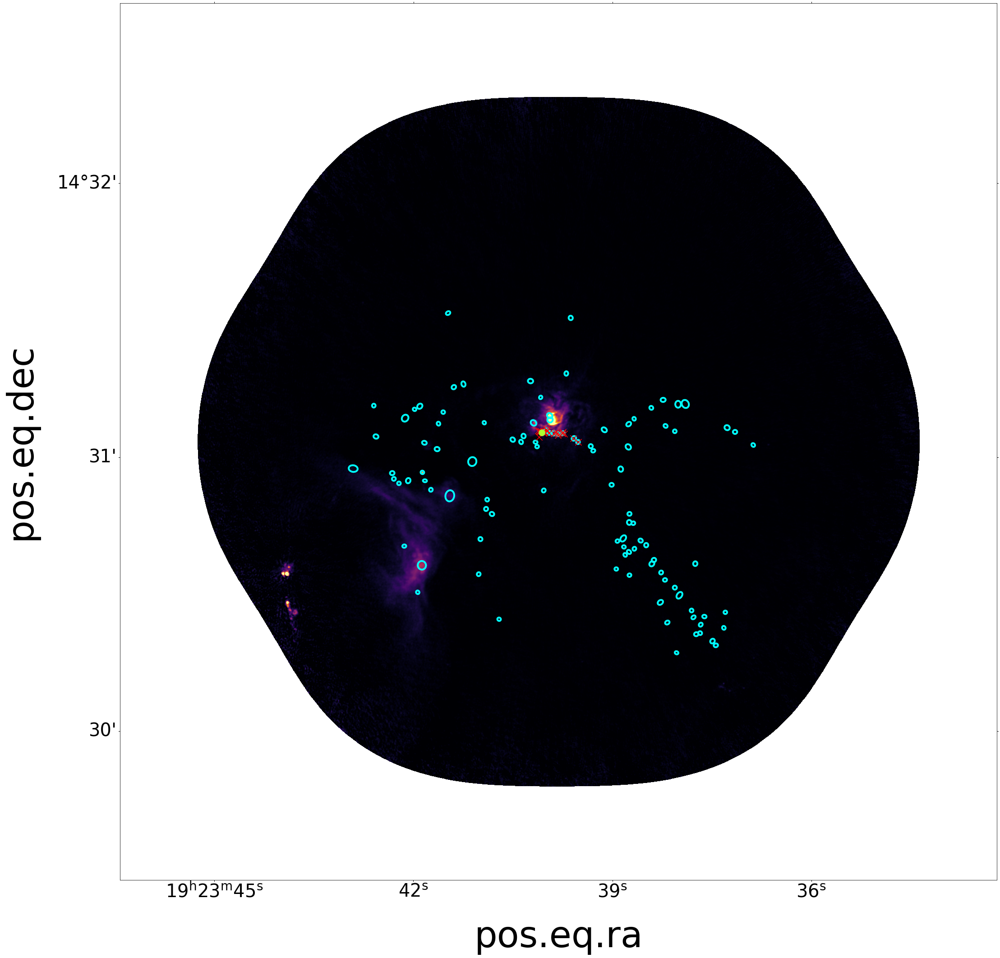

In [7]:
from regions import Regions
catalog = Table.read('../spectral_index/w51n_combined_catalog.fits',format='fits')

fitsdata = fits.open(w51n_b3_almaimf)
image = fitsdata[0].data
hdrNB = fits.getheader(w51n_b3_almaimf)  
wcsNB = WCS(hdrNB,naxis=2)
scaleNB = wcsNB.proj_plane_pixel_scales()[0]
scaleNB_phy = scaleNB * np.pi / 180 * 5.1e3 
fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB)

hdrNBalmaimf = fits.getheader(w51n_b6_almaimf)  
wcsNBalmaimf = WCS(hdrNBalmaimf,naxis=2)
beamalmaimf = Beam.from_fits_header(hdrNBalmaimf)    
skysource = np.vstack((catalog['x_sky'],catalog['y_sky'])).T
xysource = wcsNB.wcs_world2pix(skysource,0)

plot_catalog_on_image(ax1,image,hdrNB,cat_w51n,isb3=False,beam=beamalmaimf,use_criteria=True,color='cyan',lw=4,vmax=0.02)
plot_dendrogram(ax1, catalog,wcsNB=wcsNB,size=200,color='r')
pix1 = wcsNB.world_to_pixel(skylim1)
pix2 = wcsNB.world_to_pixel(skylim2)
regions = Regions.read('/orange/adamginsburg/w51/TaehwaYoo/Maxime.reg', format='ds9')
#regions.write('/orange/adamginsburg/w51/TaehwaYoo/Maxime.crtf', format='crtf')
regions.write('/orange/adamginsburg/w51/TaehwaYoo/Maxime2.reg', format='ds9')

pixel_region = regions.to_pixel(wcsNB)
pixel_region.plot(ax=ax1, color='red', lw=2.0)



rec_ind [ 0  1  2  3  4  5  6  7  8  9 11 12 13 16 18 22 24 26 27 31 35]
[7566.00000001 7602.99999999 7548.         7487.99999999 7514.00000001
 7440.00000001 7415.00000001 7028.         6873.00000001 7364.
 7074.         7104.00000001 7339.99999999 7390.         6989.
 7356.         7325.00000001 6995.99999999 7357.         7285.99999999
 7273.99999999 7292.         7310.00000001 7253.         7264.00000001
 7311.00000001 7712.         7079.         6788.00000001 6900.99999999
 7150.99999999 7241.00000001 7258.         7135.99999999 7273.
 7120.         7194.99999999 7079.         8009.00000001 7310.
 7961.00000001 7317.99999999 8132.         7338.99999999 7193.
 7430.00000001 7312.         7201.99999999 7403.         7199.99999999
 7270.         7215.99999999 7227.         7271.00000001 7213.00000001
 7369.         7501.         7543.         7496.00000001 7562.
 7426.         7436.00000001 7423.         8088.         7422.99999999
 7406.         7427.00000001 7017.99999999 7368.9999

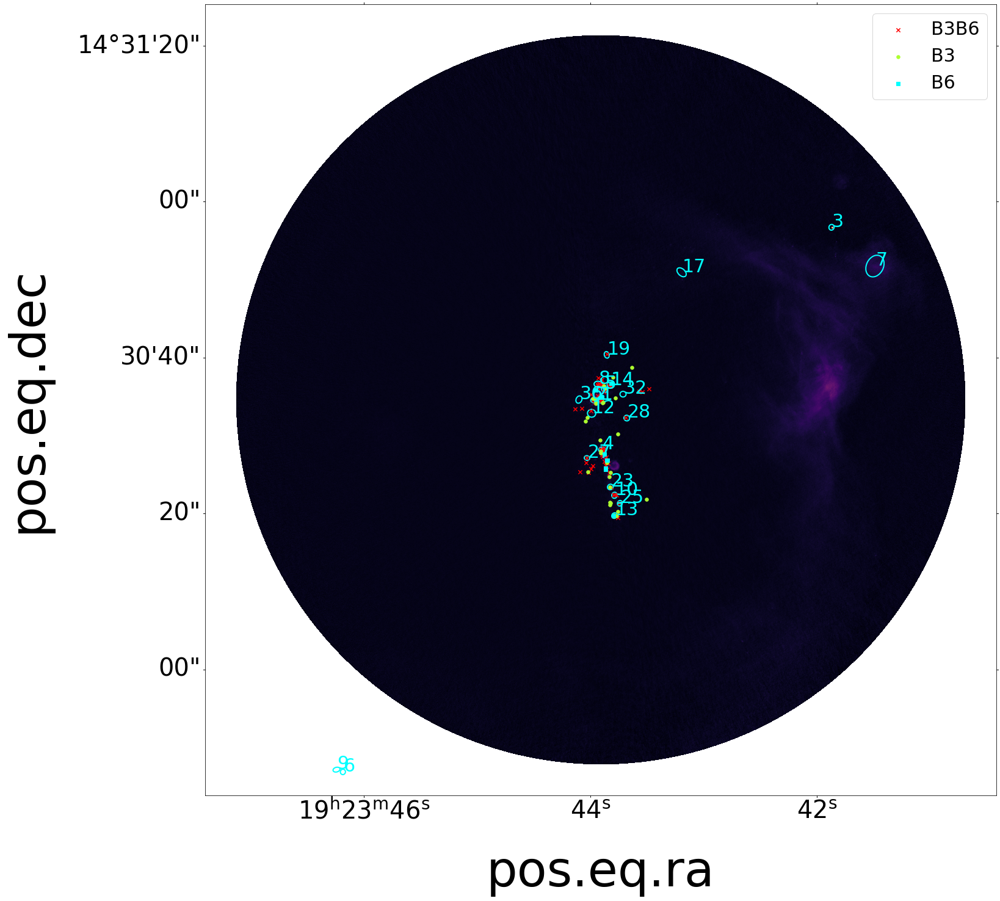

In [14]:
from astropy.coordinates import SkyCoord
fitsdata = fits.open(w51e_b3_tt0)
image = fitsdata[0].data
hdrNB = fits.getheader(w51e_b3_tt0)  
wcsNB = WCS(hdrNB,naxis=2)
scaleNB = wcsNB.proj_plane_pixel_scales()[0]
scaleNB_phy = scaleNB * np.pi / 180 * 5.41e3 
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB)
catalog = Table.read('../spectral_index/w51e_combined_catalog.fits',format='fits')

hdrNBalmaimf = fits.getheader(w51e_b3_almaimf)  
wcsNBalmaimf = WCS(hdrNBalmaimf,naxis=2)
beamalmaimf = Beam.from_fits_header(hdrNBalmaimf)    
skysource = np.vstack((catalog['x_sky'],catalog['y_sky'])).T
xysource = wcsNB.wcs_world2pix(skysource,0)
#plot_catalog_on_image(ax1,image,hdrNB,cat_w51e,isb3=False,beam=beamalmaimf,use_criteria=False,color='w',xysource=xysource)
plot_catalog_on_image(ax1,image,hdrNB,cat_w51e,isb3=True,beam=beamalmaimf,use_criteria=True,color='cyan',xysource=xysource, plot_no=True)

#plot_catalog_on_image(ax1,image,hdrNB,cat_w51n,isb3=False,beam=beamalmaimf,use_criteria=True,xysource=xysource,lw=4,label=[1,6,2,41,5,7,68,25])
plot_dendrogram(ax1, catalog, wcsNB =wcsNB)

lim1 = wcsNB.world_to_pixel(SkyCoord(290.93426384, 14.50523611, unit='deg'))
lim2 = wcsNB.world_to_pixel(SkyCoord(290.93084938, 14.51165277, unit='deg'))
#ax1.set_xlim(lim1[0],lim2[0])
#ax1.set_ylim(lim1[1],lim2[1])
#ax1.set_xlim(4500,8000)
#ax1.set_ylim(2500,7800)
ax1.legend(fontsize=30)
plt.savefig('w51e_almaimf_highres.png')


In [ ]:
fitsdata = fits.open(w51n_b3_tt0)
image = fitsdata[0].data
hdrNB = fits.getheader(w51n_b3_tt0)  
wcsNB = WCS(hdrNB,naxis=2)

fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB)
plot_catalog_on_image(ax1,image,hdrNB,cat_w51n,isb3=True,use_criteria=False)
catalog = Table.read('../alpha/w51n_combined_catalog.fits',format='fits')
plot_dendrogram(ax1, catalog)
ax1.set_xlim(6500,8500)
ax1.set_ylim(7000,7500)

In [ ]:
fitsdata = fits.open(w51n_b3_tt0)
image = fitsdata[0].data
hdrNB = fits.getheader(w51n_b3_tt0)  
wcsNB = WCS(hdrNB,naxis=2)

hdrNBalmaimf = fits.getheader(w51n_b3_almaimf)  
wcsNBalmaimf = WCS(hdrNBalmaimf,naxis=2)
beamalmaimf = Beam.from_fits_header(hdrNBalmaimf)
fig = plt.figure(figsize=(30,30))
ax1 = fig.add_axes([0.1,0.1,0.9,0.9],projection=wcsNB)
plot_catalog_on_image(ax1,image,hdrNB,cat_w51n,isb3=True,beam=beamalmaimf)
catalog = Table.read('../alpha/w51n_combined_catalog.fits',format='fits')
plot_dendrogram(ax1, catalog)
ax1.set_xlim(6500,8500)
ax1.set_ylim(7000,8000)